In [2]:
!pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 24.0 MB/s eta 0:00:00


In [3]:
import os
import numpy as np
import tensorflow as tf
import pydicom
import cv2
import matplotlib.pyplot as plt  # plt를 사용하기 위해 import

from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, Dropout, Concatenate
from tensorflow.keras.models import Model

In [4]:
# DICOM 이미지 불러오기 함수 정의
def load_dicom_images(folder_path):
    images = []
    for filename in sorted(os.listdir(folder_path)):
        if filename.endswith(".dcm"):
            dicom_path = os.path.join(folder_path, filename)
            dicom = pydicom.dcmread(dicom_path)
            img = dicom.pixel_array.astype(np.float32)
            img = cv2.resize(img, (256, 256))  # 이미지를 256x256으로 리사이즈

            # 정규화 (0으로 나누기 방지)
            min_val, max_val = np.min(img), np.max(img)
            if max_val - min_val != 0:
                img = (img - min_val) / (max_val - min_val)
            else:
                img = np.zeros_like(img)  # 값이 동일한 경우 0으로 채워진 이미지

            images.append(img)
    return np.array(images)

In [6]:
# 데이터 경로 설정
t1post_before_folder = '/content/drive/MyDrive/tumorpred/raw_data/manifest-1542731028231/Brain-Tumor-Progression/PGBM-001/pre/T2reg'
t1post_after_folder = '/content/drive/MyDrive/tumorpred/raw_data/manifest-1542731028231/Brain-Tumor-Progression/PGBM-001/post/T2reg'
mask_folder = '/content/drive/MyDrive/tumorpred/raw_data/manifest-1542731028231/Brain-Tumor-Progression/PGBM-001/pre/5364.000000-MaskTumor-94345'

In [7]:
# 이미지 불러오기
t1post_before = load_dicom_images(t1post_before_folder)
t1post_after = load_dicom_images(t1post_after_folder)
mask = load_dicom_images(mask_folder)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
# 원본 해상도 확인
original_height, original_width = t1post_before.shape[1], t1post_before.shape[2]

# 입력 데이터 결합 (T1post + Mask)
input_images = np.stack([t1post_before, mask], axis=-1)

In [9]:
# pix2pix 모델 구축 함수
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

def Pix2Pix():
    inputs = tf.keras.layers.Input(shape=[original_height, original_width, 2])
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')

    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])
    x = last(x)

    return Model(inputs=inputs, outputs=x)


Epoch 1/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 18s 13ms/step - loss: 0.1834
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0971
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0831
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0826
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0790
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0833
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0838
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0766
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0730
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0748
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0694
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0716
Epoch 13/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0715
Epoch 14/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0680
Epoch 15/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0628
Epo

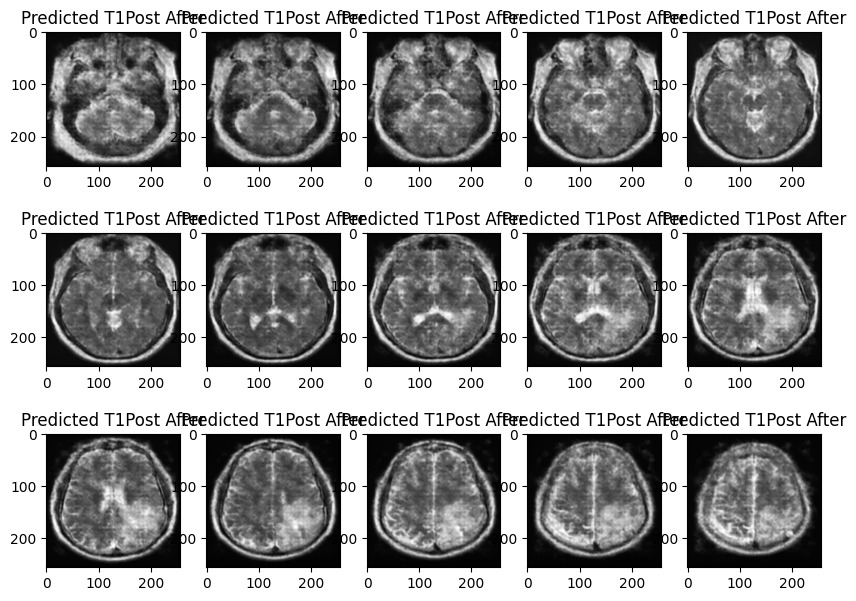

In [10]:
# 모델 초기화
generator = Pix2Pix()
generator.compile(optimizer='adam', loss='mae')

# 모델 학습 (단순화된 예제)
generator.fit(input_images, t1post_after, epochs=50, batch_size=1)  # SyntaxError 해결: 괄호 닫음

# 예측 및 결과 확인
predicted_images = generator.predict(input_images)

# # 예측 결과 시각화
plt.figure(figsize=(10, 10))
for i in range(len(predicted_images)):
    plt.subplot(4, 5, i + 1)
    plt.imshow(predicted_images[i].squeeze(), cmap='gray')
    plt.title("Predicted T1Post After")
    if i >= 19:
     break
plt.show()

In [11]:
# 예측 결과와 정답 데이터를 나란히 출력하는 함수
def display_predictions(predicted_images, ground_truth_images, num_images=5):
    plt.figure(figsize=(10, 4 * num_images))
    for i in range(num_images):
        # 예측 결과
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(predicted_images[i].squeeze(), cmap='gray')
        plt.title("Predicted Image")
        plt.axis('off')

        # 정답 데이터
        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(ground_truth_images[i].squeeze(), cmap='gray')
        plt.title("Ground Truth Image")
        plt.axis('off')

    plt.show()

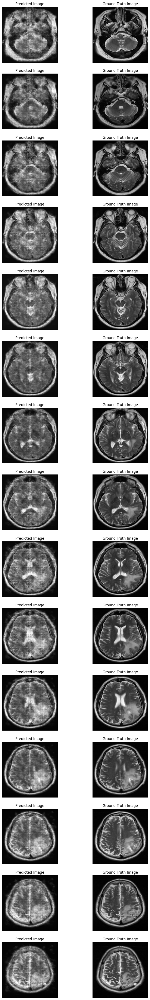

In [13]:
# 예측 결과와 정답 데이터 (t1post_after)를 비교하기
display_predictions(predicted_images, t1post_after, num_images=15)

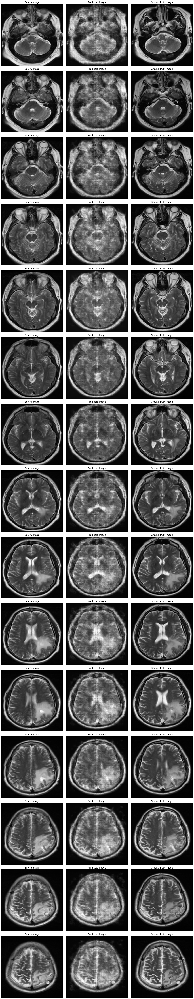

In [15]:
def display_predictions(before_images, predicted_images, ground_truth_images, num_images=5):
    """
    Before, Predicted, Ground Truth 이미지를 나란히 출력합니다.

    Args:
        before_images (tensor): Before 이미지 텐서.
        predicted_images (tensor): Predicted 이미지 텐서.
        ground_truth_images (tensor): Ground Truth 이미지 텐서.
        num_images (int): 시각화할 이미지 개수.
    """
    plt.figure(figsize=(15, 5 * num_images))  # 전체 크기 설정
    for i in range(num_images):
        # Before 이미지
        plt.subplot(num_images, 3, 3 * i + 1)
        plt.imshow(before_images[i].squeeze(), cmap='gray')
        plt.title("Before Image")
        plt.axis('off')

        # Predicted 이미지
        plt.subplot(num_images, 3, 3 * i + 2)
        plt.imshow(predicted_images[i].squeeze(), cmap='gray')
        plt.title("Predicted Image")
        plt.axis('off')

        # Ground Truth 이미지
        plt.subplot(num_images, 3, 3 * i + 3)
        plt.imshow(ground_truth_images[i].squeeze(), cmap='gray')
        plt.title("Ground Truth Image")
        plt.axis('off')

    plt.tight_layout()  # 레이아웃 조정
    plt.show()

# 함수 실행: Before, Predicted, Ground Truth 비교
display_predictions(t1post_before, predicted_images, t1post_after, num_images=15)